# Capstone Project - The Battle of the Neighborhoods
### Applied Data Science Capstone by IBM/Coursera

## Table of contents
* [Introduction: Business Problem](#introduction)
* [Data](#data)
* [Methodology](#methodology)
* [Analysis](#analysis)
* [Results and Discussion](#results)
* [Conclusion](#conclusion)



## Introduction: Business Problem <a name="introduction"></a>

The objective of this project is to find an optimal location for our client to open a new **Italian restaurant** in **Calgary**, Canada. 

The criteria that we will use to choose the optimal location are:
* Proximity to other restaurants - look for areas of with low restaurant density
* No Italian restaurants nearby
* Preference will be given to new and upcoming neighborhoods in the west and south of the city

We will use our knowledge of data science to identify a few potential neighborhoods based on the above criteria. The advantages of each neighborhood will be identified to assist our client in making the final choice.

## Data Sources

The following data sources will be utilized to find the optimal location for a new Italian restaurant:

* The neighborhoods in Calgary and there geographic coordinates as well as demographic information will be obtained from the City of Calgary.
* Neighborhood demographics information including the number of restaurants, the types of restaurants and their locations in each neighborhood will be obtained using the FourSquare API.



## Methodology <a name="methodology"></a>

In [66]:
#!pip install bs4
#!pip install pandas
#!pip install sodapy

In [67]:
import requests
import pandas as pd
from bs4 import BeautifulSoup

import pandas as pd
from sodapy import Socrata

Obtain City of Calgary neighborhood information

In [68]:
# Unauthenticated client only works with public data sets. Note 'None'
# in place of application token, and no username or password:
client = Socrata("data.calgary.ca", None)

# Example authenticated client (needed for non-public datasets):
# client = Socrata(data.calgary.ca,
#                  MyAppToken,
#                  userame="user@example.com",
#                  password="AFakePassword")

# First 2000 results, returned as JSON from API / converted to Python list of
# dictionaries by sodapy.
results = client.get("j9ps-fyst", limit=2000)

# Convert to pandas DataFrame
df = pd.DataFrame.from_records(results)

In [69]:
# Drop unneeded columns from the df
df.drop(['sector','srg','class_code', 'comm_code', 'comm_structure','location', ':@computed_region_4a3i_ccfj',':@computed_region_4b54_tmc4',':@computed_region_p8tp_5dkv',':@computed_region_kxmf_bzkv',':@computed_region_dyj4_ed5g'], axis=1,inplace=True)
# Drop non residential neighborhoods from the data file
df = df.drop(df[(df['class'] != 'Residential')].index)
# Rename df columns
df.rename(columns = {'longitude':'Longitude', 'latitude':'Latitude','name':'Neighborhood'}, inplace = True)
df.drop(columns=['class'], axis=1, inplace=True)

In [70]:
df['Latitude'] = df.Latitude.astype(float)
df['Longitude'] = df.Longitude.astype(float)
neighborhoods = df
neighborhoods.reset_index(drop=True)
neighborhoods.head()


,Neighborhood,Longitude,Latitude
0,YORKVILLE,-114.076648,50.870403
1,WOLF WILLOW,-114.008637,50.870724
2,WEST SPRINGS,-114.206168,51.059732
3,WOODLANDS,-114.106339,50.942876
4,WINDSOR PARK,-114.083550,51.005040


#### Install and import libraries

In [72]:
!pip install geopy
!pip install folium

In [74]:
import numpy as np # library to handle data in a vectorized manner

import pandas as pd # library for data analsysis
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

import json # library to handle JSON files

!conda install -c conda-forge geopy --yes # uncomment this line if you haven't completed the Foursquare API lab
from geopy.geocoders import Nominatim # convert an address into latitude and longitude values

import requests # library to handle requests
from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe

# Matplotlib and associated plotting modules
import matplotlib.cm as cm
import matplotlib.colors as colors

# import k-means from clustering stage
from sklearn.cluster import KMeans

!conda install -c conda-forge folium=0.5.0 --yes # uncomment this line if you haven't completed the Foursquare API lab
import folium # map rendering library

print('Libraries imported.')


usage: conda-script.py [-h] [-V] command ...
conda-script.py: error: unrecognized arguments: # uncomment this line if you haven't completed the Foursquare API lab


Libraries imported.


usage: conda-script.py [-h] [-V] command ...
conda-script.py: error: unrecognized arguments: # uncomment this line if you haven't completed the Foursquare API lab


#### Find geographic coordinates to Calgary

In [75]:
address = 'Calgary, AB'

geolocator = Nominatim(user_agent="yyc_explorer")
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print('The geograpical coordinates of Calgary are {}, {}.'.format(latitude, longitude))

The geograpical coordinates of Calgary are 51.0534234, -114.0625892.


#### Map the neighborhoods in Calgary

In [76]:
# create map of Calgary using latitude and longitude values
map_calgary = folium.Map(location=[latitude, longitude], zoom_start=10)

# add markers to map
for lat, lng, neighborhood in zip(neighborhoods['Latitude'], neighborhoods['Longitude'], neighborhoods['Neighborhood']):
    label = '{}'.format(neighborhood)
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        popup=label,
        color='blue',
        fill=True,
        fill_color='#3186cc',
        fill_opacity=0.7,
        parse_html=False).add_to(map_calgary)  
    
map_calgary

#### Let's take a look at Aspen Woods one of our target neighborhoods

In [77]:
aspen_woods_data = neighborhoods[neighborhoods['Neighborhood'] == 'ASPEN WOODS'].reset_index(drop=True)
aspen_woods_data

,Neighborhood,Longitude,Latitude
0,ASPEN WOODS,-114.207901,51.045129


Define Foursquare Credentials and Version 

In [129]:
CLIENT_ID = '' # your Foursquare ID
CLIENT_SECRET = '' # your Foursquare Secret
VERSION = '20210331' # Foursquare API version
LIMIT = 200 # A default Foursquare API limit value
radius = 1500
print('Your credentails:')
print('CLIENT_ID: ' + CLIENT_ID)
print('CLIENT_SECRET:' + CLIENT_SECRET)

Your credentails:
CLIENT_ID: 
CLIENT_SECRET:


Let's explore the first neighborhood in our dataframe

In [79]:
neighborhoods.loc[254, 'Neighborhood']

'ASPEN WOODS'

In [80]:
neighborhood_latitude = neighborhoods.loc[254, 'Latitude'] # neighborhood latitude value
neighborhood_longitude = neighborhoods.loc[254, 'Longitude'] # neighborhood longitude value

neighborhood_name = neighborhoods.loc[254, 'Neighborhood'] # neighborhood name

print('Latitude and longitude values of {} are {}, {}.'.format(neighborhood_name, 
                                                               neighborhood_latitude, 
                                                               neighborhood_longitude))

Latitude and longitude values of ASPEN WOODS are 51.04512921632106, -114.20790071386324.


#### Let's get the top 200 venues that are in Aspen Woods within a radius of 1500m

Create the get request

In [131]:
LIMIT = 200 # limit of number of venues returned by Foursquare API
radius = 1500 # define radius

# create URL
url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
    CLIENT_ID, 
    CLIENT_SECRET, 
    VERSION, 
    neighborhood_latitude, 
    neighborhood_longitude, 
    radius, 
    LIMIT)


In [82]:
results = requests.get(url).json()
results

{'meta': {'code': 200, 'requestId': '6081955616dc1a6374a56622'},
 'response': {'suggestedFilters': {'header': 'Tap to show:',
   'filters': [{'name': 'Open now', 'key': 'openNow'}]},
  'headerLocation': 'Aspen Woods',
  'headerFullLocation': 'Aspen Woods, Calgary',
  'headerLocationGranularity': 'neighborhood',
  'totalResults': 17,
  'suggestedBounds': {'ne': {'lat': 51.05862922982107,
    'lng': -114.18646817946073},
   'sw': {'lat': 51.031629202821044, 'lng': -114.22933324826575}},
  'groups': [{'type': 'Recommended Places',
    'name': 'recommended',
    'items': [{'reasons': {'count': 0,
       'items': [{'summary': 'This spot is popular',
         'type': 'general',
         'reasonName': 'globalInteractionReason'}]},
      'venue': {'id': '4b0586e9f964a520937422e3',
       'name': 'A Ladybug and Cafe',
       'location': {'address': '2132 - 10 Aspen Stone Blvd. SW',
        'crossStreet': 'at 85th St.',
        'lat': 51.04134019638049,
        'lng': -114.21250662761257,
      

In [83]:
# function that extracts the category of the venue
def get_category_type(row):
    try:
        categories_list = row['categories']
    except:
        categories_list = row['venue.categories']
        
    if len(categories_list) == 0:
        return None
    else:
        return categories_list[0]['name']

#### Now we are ready to clean the json and structure it into a pandas dataframe

In [84]:
venues = results['response']['groups'][0]['items']
    
nearby_venues = json_normalize(venues) # flatten JSON

# filter columns
filtered_columns = ['venue.name', 'venue.categories', 'venue.location.lat', 'venue.location.lng']
nearby_venues =nearby_venues.loc[:, filtered_columns]

# filter the category for each row
nearby_venues['venue.categories'] = nearby_venues.apply(get_category_type, axis=1)

# clean columns
nearby_venues.columns = [col.split(".")[-1] for col in nearby_venues.columns]

nearby_venues.head()

<ipython-input-84-561c05f0fdd1>:3: FutureWarning: pandas.io.json.json_normalize is deprecated, use pandas.json_normalize instead
  nearby_venues = json_normalize(venues) # flatten JSON


,name,categories,lat,lng
0,A Ladybug and Cafe,Coffee Shop,51.041340,-114.212507
1,Denim and Smith Barbershops-Aspen,Salon / Barbershop,51.039860,-114.208736
2,Blush Lane Organic Market,Grocery Store,51.041304,-114.213076
3,Diner Deluxe Aspen,Restaurant,51.039636,-114.209193
4,Original Joe's Restaurant & Bar,Restaurant,51.039232,-114.208116


In [85]:
print('{} venues were returned by Foursquare.'.format(nearby_venues.shape[0]))

17 venues were returned by Foursquare.


# Explore Neighborhoods in Calgary

#### Let's create a function to repeat the same process to all the neighborhoods in Calgary

In [86]:
def getNearbyVenues(names, latitudes, longitudes, radius=1500):
    
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Neighborhood', 
                  'Neighborhood Latitude', 
                  'Neighborhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

#### Now write the code to run the above function on each neighborhood and create a new dataframe called  calgary_venues.

In [87]:
calgary_venues = getNearbyVenues(names=neighborhoods['Neighborhood'],
                                   latitudes=neighborhoods['Latitude'],
                                   longitudes=neighborhoods['Longitude']
                                  )

YORKVILLE
WOLF WILLOW
WEST SPRINGS
WOODLANDS
WINDSOR PARK
WILDWOOD
WINSTON HEIGHTS/MOUNTVIEW
WILLOW PARK
WEST HILLHURST
WHITEHORN
WESTGATE
WOODBINE
WALDEN
VISTA HEIGHTS
VARSITY
VALLEY RIDGE
UNIVERSITY OF CALGARY
UNIVERSITY HEIGHTS
UNIVERSITY DISTRICT
UPPER MOUNT ROYAL
TUXEDO PARK
TUSCANY
TWINHILLS
THORNCLIFFE
TEMPLE
TARADALE
SYMONS VALLEY RANCH
SILVERADO
STRATHCONA PARK
ST. ANDREWS HEIGHTS
SCARBORO/ SUNALTA WEST
SUNNYSIDE
SPRUCE CLIFF
SPRINGBANK HILL
SOUTHWOOD
SOUTHVIEW
SOMERSET
SOUTH CALGARY
SUNALTA
SKYVIEW RANCH
SILVER SPRINGS
SIGNAL HILL
SHERWOOD
SHAWNEE SLOPES
SHAWNESSY
SHAGANAPPI
SAGE HILL
SETON
SUNDANCE
SCENIC ACRES
SCARBORO
SANDSTONE VALLEY
SADDLE RIDGE
RANGEVIEW
RUTLAND PARK
RUNDLE
REDSTONE
ROYAL OAK
ROXBORO
ROCKY RIDGE
ROSEMONT
RIVERBEND
RIDEAU PARK
RICHMOND
RENFREW
RED CARPET
ROSEDALE
ROSSCARROCK
RANCHLANDS
RAMSAY
QUEENS PARK VILLAGE
QUEENSLAND
PUMP HILL
POINT MCKAY
PARKLAND
PARKHILL
PARKDALE
PINERIDGE
PENBROOKE MEADOWS
PINE CREEK
PATTERSON
PANORAMA HILLS
PALLISER
OGDEN
OAKRI

#### Let's check the size of the resulting datframe

In [88]:
print(calgary_venues.shape)
calgary_venues.head()

(8059, 7)


,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,YORKVILLE,50.870403,-114.076648,Kildares Ale House,50.877934,-114.071518,Bar
1,YORKVILLE,50.870403,-114.076648,Sobeys - Silverado,50.879006,-114.072621,Grocery Store
2,YORKVILLE,50.870403,-114.076648,Dairy Queen / Orange Julius,50.878756,-114.072321,Ice Cream Shop
3,YORKVILLE,50.870403,-114.076648,Starbucks Silverado,50.877897,-114.072121,Coffee Shop
4,YORKVILLE,50.870403,-114.076648,Beauty Boutique by Shoppers Drug Mart,50.878755,-114.072320,Cosmetics Shop


#### Let's check how many venues were returned for each neighborhood

In [89]:
calgary_venues = calgary_venues[calgary_venues['Venue Category'].str.contains('Rest|Diner|Steakhouse')].copy()

In [90]:
calgary_venues.groupby('Neighborhood').count()

,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
Neighborhood,,,,,,
ABBEYDALE,2,2,2,2,2,2
ACADIA,25,25,25,25,25,25
ALBERT PARK/RADISSON HEIGHTS,13,13,13,13,13,13
ALTADORE,5,5,5,5,5,5
APPLEWOOD PARK,4,4,4,4,4,4
ARBOUR LAKE,15,15,15,15,15,15
ASPEN WOODS,6,6,6,6,6,6
AUBURN BAY,5,5,5,5,5,5
BANFF TRAIL,9,9,9,9,9,9


In [91]:
print('There are {} uniques categories.'.format(len(calgary_venues['Venue Category'].unique())))

There are 47 uniques categories.


Filter calgary_venues for venue categories containing 'Rest|Diner|Steakhouse' and create new restaurants dataframe

In [92]:
#calgary_venues
restaurants = calgary_venues[calgary_venues['Venue Category'].str.contains('Rest|Diner|Steakhouse')].copy()

In [93]:
restaurants.reset_index(drop=True, inplace=True)
restaurants.head()

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,YORKVILLE,50.870403,-114.076648,Kungfu Restaurant,50.878911,-114.072125,Asian Restaurant
1,WEST SPRINGS,51.059732,-114.206168,Fergus & Bix Restaurant and Beer Market,51.059953,-114.212111,Restaurant
2,WEST SPRINGS,51.059732,-114.206168,Cafe MoMoKo,51.063516,-114.194704,Restaurant
3,WEST SPRINGS,51.059732,-114.206168,Mercato West,51.060777,-114.212535,Italian Restaurant
4,WEST SPRINGS,51.059732,-114.206168,Vin Room,51.060566,-114.210780,Tapas Restaurant


Filter calgary_venues for venue categories containing 'Italian' and create new italian_restaurants dataframe

In [94]:
italian_restaurants = calgary_venues[calgary_venues['Venue Category'].str.contains('Italian')].copy()
italian_restaurants.reset_index(drop=True, inplace=True)
italian_restaurants.head()

,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,WEST SPRINGS,51.059732,-114.206168,Mercato West,51.060777,-114.212535,Italian Restaurant
1,WINDSOR PARK,51.005040,-114.083550,"Double Zero ""00"" Chinook",50.999970,-114.072348,Italian Restaurant
2,WINDSOR PARK,51.005040,-114.083550,Buffo Ristorante,50.999308,-114.074521,Italian Restaurant
3,WINSTON HEIGHTS/MOUNTVIEW,51.075324,-114.041857,Scopa Neighbourhood Italian,51.072175,-114.062348,Italian Restaurant
4,WINSTON HEIGHTS/MOUNTVIEW,51.075324,-114.041857,Lina's Italian Market & Cappucino Bar,51.072025,-114.062347,Italian Restaurant


#### Let's calculate the % of restaurants that are Italian restaurants

In [95]:
import numpy as np

print('Total number of restaurants:', len(restaurants))
print('Total number of Italian restaurants:', len(italian_restaurants))
print('Percentage of Italian restaurants: {:.2f}%'.format(len(italian_restaurants) / len(restaurants) * 100))


Total number of restaurants: 1999
Total number of Italian restaurants: 125
Percentage of Italian restaurants: 6.25%


Group the restaurants by neighborhood and count the number of venues in each neighborhood

In [96]:
restaurants.groupby('Neighborhood').count()

,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
Neighborhood,,,,,,
ABBEYDALE,2,2,2,2,2,2
ACADIA,25,25,25,25,25,25
ALBERT PARK/RADISSON HEIGHTS,13,13,13,13,13,13
ALTADORE,5,5,5,5,5,5
APPLEWOOD PARK,4,4,4,4,4,4
ARBOUR LAKE,15,15,15,15,15,15
ASPEN WOODS,6,6,6,6,6,6
AUBURN BAY,5,5,5,5,5,5
BANFF TRAIL,9,9,9,9,9,9


In [97]:
print('There are {} uniques categories.'.format(len(restaurants['Venue Category'].unique())))

There are 47 uniques categories.


# Analyze each neighborhood

In [98]:
# one hot encoding
calgary_onehot = pd.get_dummies(calgary_venues[['Venue Category']], prefix="", prefix_sep="")

# add neighborhood column back to dataframe
calgary_onehot['Neighborhood'] = calgary_venues['Neighborhood'] 

# move neighborhood column to the first column
fixed_columns = [calgary_onehot.columns[-1]] + list(calgary_onehot.columns[:-1])
calgary_onehot = calgary_onehot[fixed_columns]

calgary_onehot

,Neighborhood,American Restaurant,Argentinian Restaurant,Asian Restaurant,Brazilian Restaurant,Cajun / Creole Restaurant,Chinese Restaurant,Dim Sum Restaurant,Diner,Eastern European Restaurant,Empanada Restaurant,Ethiopian Restaurant,Falafel Restaurant,Fast Food Restaurant,Filipino Restaurant,French Restaurant,German Restaurant,Gluten-free Restaurant,Greek Restaurant,Hong Kong Restaurant,Indian Restaurant,Indonesian Restaurant,Italian Restaurant,Japanese Restaurant,Korean BBQ Restaurant,Korean Restaurant,Latin American Restaurant,Mediterranean Restaurant,Mexican Restaurant,Middle Eastern Restaurant,Moroccan Restaurant,New American Restaurant,Peking Duck Restaurant,Portuguese Restaurant,Ramen Restaurant,Rest Area,Restaurant,Scandinavian Restaurant,Seafood Restaurant,Shabu-Shabu Restaurant,Southern / Soul Food Restaurant,Steakhouse,Sushi Restaurant,Swiss Restaurant,Tapas Restaurant,Thai Restaurant,Vegetarian / Vegan Restaurant,Vietnamese Restaurant
6,YORKVILLE,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
14,WEST SPRINGS,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0
18,WEST SPRINGS,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0
19,WEST SPRINGS,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
20,WEST SPRINGS,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0
28,WEST SPRINGS,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
33,WEST SPRINGS,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
44,WOODLANDS,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
46,WOODLANDS,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
49,WOODLANDS,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0


And let's examine the new dataframe size.

In [99]:
calgary_onehot.shape

(1999, 48)

#### Next, let's group rows by neighborhood and by taking the mean of the frequency of occurrence of each category

In [100]:
calgary_grouped = calgary_onehot.groupby('Neighborhood').mean().reset_index()
calgary_grouped

,Neighborhood,American Restaurant,Argentinian Restaurant,Asian Restaurant,Brazilian Restaurant,Cajun / Creole Restaurant,Chinese Restaurant,Dim Sum Restaurant,Diner,Eastern European Restaurant,Empanada Restaurant,Ethiopian Restaurant,Falafel Restaurant,Fast Food Restaurant,Filipino Restaurant,French Restaurant,German Restaurant,Gluten-free Restaurant,Greek Restaurant,Hong Kong Restaurant,Indian Restaurant,Indonesian Restaurant,Italian Restaurant,Japanese Restaurant,Korean BBQ Restaurant,Korean Restaurant,Latin American Restaurant,Mediterranean Restaurant,Mexican Restaurant,Middle Eastern Restaurant,Moroccan Restaurant,New American Restaurant,Peking Duck Restaurant,Portuguese Restaurant,Ramen Restaurant,Rest Area,Restaurant,Scandinavian Restaurant,Seafood Restaurant,Shabu-Shabu Restaurant,Southern / Soul Food Restaurant,Steakhouse,Sushi Restaurant,Swiss Restaurant,Tapas Restaurant,Thai Restaurant,Vegetarian / Vegan Restaurant,Vietnamese Restaurant
0,ABBEYDALE,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
1,ACADIA,0.120000,0.000000,0.040000,0.000000,0.000000,0.040000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.200000,0.000000,0.040000,0.000000,0.000000,0.040000,0.0000,0.000000,0.000000,0.080000,0.040000,0.000000,0.000000,0.000000,0.000000,0.120000,0.000000,0.000000,0.000000,0.00,0.000000,0.000000,0.0,0.040000,0.000000,0.040000,0.000000,0.000000,0.000000,0.040000,0.040000,0.000000,0.000000,0.000000,0.120000
2,ALBERT PARK/RADISSON HEIGHTS,0.000000,0.000000,0.153846,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.076923,0.076923,0.153846,0.000000,0.000000,0.000000,0.000000,0.000000,0.0000,0.076923,0.000000,0.076923,0.076923,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00,0.000000,0.000000,0.0,0.153846,0.000000,0.076923,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.076923
3,ALTADORE,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.200000,0.0000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00,0.000000,0.000000,0.0,0.200000,0.000000,0.000000,0.000000,0.000000,0.000000,0.200000,0.000000,0.000000,0.200000,0.000000,0.200000
4,APPLEWOOD PARK,0.000000,0.000000,0.000000,0.000000,0.000000,0.250000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.250000,0.000000,0.000000,0.000000,0.000000,0.0000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00,0.000000,0.000000,0.0,0.250000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.250000
5,ARBOUR LAKE,0.000000,0.000000,0.066667,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.333333,0.000000,0.000000,0.000000,0.000000,0.000000,0.0000,0.066667,0.000000,0.066667,0.066667,0.000000,0.000000,0.000000,0.000000,0.066667,0.000000,0.000000,0.066667,0.00,0.000000,0.000000,0.0,0.066667,0.000000,0.000000,0.000000,0.000000,0.000000,0.133333,0.000000,0.000000,0.000000,0.000000,0.066667
6,ASPEN WOODS,0.000000,0.000000,0.166667,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0000,0.166667,0.000000,0.000000,0.166667,0.000000,0.000000,0.000000,0.000000,0.166667,0.000000,0.000000,0.000000,0.00,0.000000,0.000000,0.0,0.333333,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
7,AUBURN BAY,0.200000,0.000000,0.000000,0.00000

#### Let's confirm the new size

In [101]:
calgary_grouped.shape

(190, 48)

#### Let's print each neighborhood along with the top 5 most common venues

In [102]:
num_top_venues = 5

for hood in calgary_grouped['Neighborhood']:
    print("----"+hood+"----")
    temp = calgary_grouped[calgary_grouped['Neighborhood'] == hood].T.reset_index()
    temp.columns = ['venue','freq']
    temp = temp.iloc[1:]
    temp['freq'] = temp['freq'].astype(float)
    temp = temp.round({'freq': 2})
    print(temp.sort_values('freq', ascending=False).reset_index(drop=True).head(num_top_venues))
    print('\n')

----ABBEYDALE----
                       venue  freq
0       Fast Food Restaurant   1.0
1          Korean Restaurant   0.0
2   Mediterranean Restaurant   0.0
3         Mexican Restaurant   0.0
4  Middle Eastern Restaurant   0.0


----ACADIA----
                   venue  freq
0   Fast Food Restaurant  0.20
1    American Restaurant  0.12
2     Mexican Restaurant  0.12
3  Vietnamese Restaurant  0.12
4     Italian Restaurant  0.08


----ALBERT PARK/RADISSON HEIGHTS----
                   venue  freq
0             Restaurant  0.15
1       Asian Restaurant  0.15
2   Fast Food Restaurant  0.15
3  Vietnamese Restaurant  0.08
4    Japanese Restaurant  0.08


----ALTADORE----
                   venue  freq
0  Vietnamese Restaurant   0.2
1       Sushi Restaurant   0.2
2       Greek Restaurant   0.2
3             Restaurant   0.2
4        Thai Restaurant   0.2


----APPLEWOOD PARK----
                   venue  freq
0  Vietnamese Restaurant  0.25
1    Filipino Restaurant  0.25
2     Chinese Restaur

                      venue  freq
0      Fast Food Restaurant  0.50
1                     Diner  0.25
2  Mediterranean Restaurant  0.25
3           Thai Restaurant  0.00
4                Restaurant  0.00


----DOWNTOWN COMMERCIAL CORE----
                           venue  freq
0                     Restaurant  0.25
1                     Steakhouse  0.12
2             Italian Restaurant  0.09
3  Vegetarian / Vegan Restaurant  0.06
4              Korean Restaurant  0.06


----DOWNTOWN EAST VILLAGE----
                 venue  freq
0           Restaurant  0.19
1   Italian Restaurant  0.16
2           Steakhouse  0.10
3  American Restaurant  0.06
4   Seafood Restaurant  0.06


----DOWNTOWN WEST END----
                   venue  freq
0             Restaurant  0.16
1  Vietnamese Restaurant  0.06
2             Steakhouse  0.06
3    Moroccan Restaurant  0.06
4      Korean Restaurant  0.06


----EAGLE RIDGE----
                      venue  freq
0       Japanese Restaurant   1.0
1       American 

4             Italian Restaurant  0.07


----MONTEREY PARK----
                   venue  freq
0  Vietnamese Restaurant  0.33
1     Italian Restaurant  0.33
2   Fast Food Restaurant  0.33
3        Thai Restaurant  0.00
4              Rest Area  0.00


----MONTGOMERY----
                      venue  freq
0                Restaurant  0.67
1      Fast Food Restaurant  0.33
2         Korean Restaurant  0.00
3  Mediterranean Restaurant  0.00
4        Mexican Restaurant  0.00


----MOUNT PLEASANT----
                   venue  freq
0  Vietnamese Restaurant  0.14
1             Restaurant  0.14
2     Chinese Restaurant  0.14
3   Fast Food Restaurant  0.10
4     Italian Restaurant  0.10


----NEW BRIGHTON----
                 venue  freq
0     Asian Restaurant  0.25
1    Indian Restaurant  0.25
2     Sushi Restaurant  0.25
3   Seafood Restaurant  0.25
4  American Restaurant  0.00


----NOLAN HILL----
                      venue  freq
0                Restaurant  0.67
1      Fast Food Restaurant  

                       venue  freq
0                 Restaurant   1.0
1        American Restaurant   0.0
2   Mediterranean Restaurant   0.0
3         Mexican Restaurant   0.0
4  Middle Eastern Restaurant   0.0


----TEMPLE----
                   venue  freq
0       Asian Restaurant   0.2
1      Indian Restaurant   0.2
2  Vietnamese Restaurant   0.1
3                  Diner   0.1
4    Japanese Restaurant   0.1


----THORNCLIFFE----
                   venue  freq
0   Fast Food Restaurant  0.31
1     Chinese Restaurant  0.23
2  Vietnamese Restaurant  0.23
3       Sushi Restaurant  0.15
4      Indian Restaurant  0.08


----TUSCANY----
                       venue  freq
0       Fast Food Restaurant   1.0
1          Korean Restaurant   0.0
2   Mediterranean Restaurant   0.0
3         Mexican Restaurant   0.0
4  Middle Eastern Restaurant   0.0


----TUXEDO PARK----
                   venue  freq
0     Chinese Restaurant  0.12
1             Restaurant  0.12
2   Fast Food Restaurant  0.12
3  Vi

#### Let's put that into a _pandas_ dataframe

First, let's write a function to sort the venues in descending order.

In [103]:
def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_venues]

Now let's create the new dataframe and display the top 10 venues for each neighborhood.

In [104]:
num_top_venues = 10

indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['Neighborhood']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
neighborhoods_venues_sorted = pd.DataFrame(columns=columns)
neighborhoods_venues_sorted['Neighborhood'] = calgary_grouped['Neighborhood']

for ind in np.arange(calgary_grouped.shape[0]):
    neighborhoods_venues_sorted.iloc[ind, 1:] = return_most_common_venues(calgary_grouped.iloc[ind, :], num_top_venues)

neighborhoods_venues_sorted.head()

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,ABBEYDALE,Fast Food Restaurant,Vietnamese Restaurant,Falafel Restaurant,Indonesian Restaurant,Indian Restaurant,Hong Kong Restaurant,Greek Restaurant,Gluten-free Restaurant,German Restaurant,French Restaurant
1,ACADIA,Fast Food Restaurant,Vietnamese Restaurant,Mexican Restaurant,American Restaurant,Italian Restaurant,Japanese Restaurant,Asian Restaurant,Chinese Restaurant,French Restaurant,Greek Restaurant
2,ALBERT PARK/RADISSON HEIGHTS,Asian Restaurant,Fast Food Restaurant,Restaurant,Vietnamese Restaurant,Seafood Restaurant,Indian Restaurant,Falafel Restaurant,Ethiopian Restaurant,Italian Restaurant,Japanese Restaurant
3,ALTADORE,Vietnamese Restaurant,Thai Restaurant,Sushi Restaurant,Greek Restaurant,Restaurant,Ethiopian Restaurant,Indian Restaurant,Hong Kong Restaurant,Gluten-free Restaurant,German Restaurant
4,APPLEWOOD PARK,Vietnamese Restaurant,Chinese Restaurant,Filipino Restaurant,Restaurant,Falafel Restaurant,Indonesian Restaurant,Indian Restaurant,Hong Kong Restaurant,Greek Restaurant,Gluten-free Restaurant


# Cluster Neighborhoods

Run k-means to cluster the neighborhoods into 5 clusters

In [105]:
# set number of clusters
kclusters = 5

calgary_grouped_clustering = calgary_grouped.drop('Neighborhood', 1)

# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(calgary_grouped_clustering)

# check cluster labels generated for each row in the dataframe
kmeans.labels_[0:33] 

array([4, 2, 0, 0, 0, 2, 0, 0, 2, 0, 1, 2, 0, 2, 0, 0, 2, 1, 2, 2, 0, 0,
       1, 0, 1, 2, 0, 0, 4, 2, 2, 0, 0])

Let's create a new dataframe that includes the cluster as well as the top 10 venues for each neighborhood.

In [106]:
# add clustering labels
neighborhoods_venues_sorted.insert(0, 'Cluster Labels', kmeans.labels_)

In [107]:
#neighborhoods_venues_sorted
calgary_merged = neighborhoods

#merge calgary_grouped with neighborhood data to add latitude/longitude for each neighborhood
calgary_merged = calgary_merged.join(neighborhoods_venues_sorted.set_index('Neighborhood'), on='Neighborhood')
calgary_merged.dropna(subset = ["Cluster Labels"], inplace=True)
calgary_merged["Cluster Labels"]=calgary_merged["Cluster Labels"].astype(np.int64)
calgary_merged # check the last columns!


,Neighborhood,Longitude,Latitude,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,YORKVILLE,-114.076648,50.870403,3,Asian Restaurant,Vietnamese Restaurant,Falafel Restaurant,Indonesian Restaurant,Indian Restaurant,Hong Kong Restaurant,Greek Restaurant,Gluten-free Restaurant,German Restaurant,French Restaurant
2,WEST SPRINGS,-114.206168,51.059732,2,Restaurant,Tapas Restaurant,Sushi Restaurant,Italian Restaurant,Fast Food Restaurant,Vietnamese Restaurant,Falafel Restaurant,Indian Restaurant,Hong Kong Restaurant,Greek Restaurant
3,WOODLANDS,-114.106339,50.942876,2,Asian Restaurant,Sushi Restaurant,Seafood Restaurant,Fast Food Restaurant,Vietnamese Restaurant,Falafel Restaurant,Indian Restaurant,Hong Kong Restaurant,Greek Restaurant,Gluten-free Restaurant
4,WINDSOR PARK,-114.083550,51.005040,0,Vietnamese Restaurant,Restaurant,Italian Restaurant,Greek Restaurant,Japanese Restaurant,Brazilian Restaurant,Vegetarian / Vegan Restaurant,Steakhouse,Korean Restaurant,New American Restaurant
6,WINSTON HEIGHTS/MOUNTVIEW,-114.041857,51.075324,0,Chinese Restaurant,Italian Restaurant,Japanese Restaurant,Mediterranean Restaurant,Dim Sum Restaurant,Restaurant,Fast Food Restaurant,Filipino Restaurant,Indonesian Restaurant,Indian Restaurant
7,WILLOW PARK,-114.056204,50.956623,2,Restaurant,Fast Food Restaurant,Sushi Restaurant,Italian Restaurant,Japanese Restaurant,Steakhouse,Greek Restaurant,Diner,Falafel Restaurant,Indian Restaurant
8,WEST HILLHURST,-114.115159,51.055060,0,Sushi Restaurant,Chinese Restaurant,American Restaurant,Thai Restaurant,Japanese Restaurant,Restaurant,Moroccan Restaurant,Fast Food Restaurant,Falafel Restaurant,Hong Kong Restaurant
9,WHITEHORN,-113.970068,51.088774,0,Indian Restaurant,Asian Restaurant,Vietnamese Restaurant,Diner,Mediterranean Restaurant,Portuguese Restaurant,Fast Food Restaurant,Japanese Restaurant,Chinese Restaurant,Dim Sum Restaurant
10,WESTGATE,-114.158457,51.044160,2,Vietnamese Restaurant,Fast Food Restaurant,Japanese Restaurant,Chinese Restaurant,Diner,Seafood Restaurant,Indonesian Restaurant,Indian Restaurant,Hong Kong Restaurant,Greek Restaurant
12,WOODBINE,-114.129615,50.941348,0,Vietnamese Restaurant,Asian Restaurant,Restaurant,Falafel Restaurant,Indonesian Restaurant,Indian Restaurant,Hong Kong Restaurant,Greek Restaurant,Gluten-free Restaurant,German Restaurant


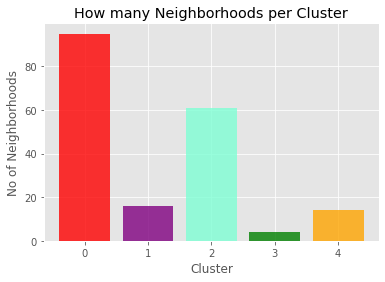

In [128]:
objects = (0,1,2,3,4)
y_pos = np.arange(len(objects))
performance = calgary_merged['Cluster Labels'].value_counts().to_frame().sort_index(ascending=True)
perf = performance['Cluster Labels'].tolist()
plt.bar(y_pos, perf, align='center', alpha=0.8, color=['red', 'purple','aquamarine', 'green','orange'])
plt.xticks(y_pos, objects)
plt.ylabel('No of Neighborhoods')
plt.xlabel('Cluster')
plt.title('How many Neighborhoods per Cluster')

plt.show()

### Finally, let's visualize the resulting clusters

In [109]:
# create map
map_clusters = folium.Map(location=[latitude, longitude], zoom_start=11)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(calgary_merged['Latitude'], calgary_merged['Longitude'], calgary_merged['Neighborhood'], calgary_merged['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(map_clusters)
       
map_clusters

## Analysis: <a name="analysis"></a>

### Examine Clusters

Cluster 0 contains the majority of our candidate neighborhoods and this cluster appears to be comprised of mostly oriental restaurants. Cluster 2 contains the remainder of the candidate neighborhoods and appears to contain mostly Fast Food restaurants.

In [110]:
#Cluster 0
calgary_merged.loc[calgary_merged['Cluster Labels'] == 0, calgary_merged.columns[[0] + list(range(4, calgary_merged.shape[1]))]]

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
4,WINDSOR PARK,Vietnamese Restaurant,Restaurant,Italian Restaurant,Greek Restaurant,Japanese Restaurant,Brazilian Restaurant,Vegetarian / Vegan Restaurant,Steakhouse,Korean Restaurant,New American Restaurant
6,WINSTON HEIGHTS/MOUNTVIEW,Chinese Restaurant,Italian Restaurant,Japanese Restaurant,Mediterranean Restaurant,Dim Sum Restaurant,Restaurant,Fast Food Restaurant,Filipino Restaurant,Indonesian Restaurant,Indian Restaurant
8,WEST HILLHURST,Sushi Restaurant,Chinese Restaurant,American Restaurant,Thai Restaurant,Japanese Restaurant,Restaurant,Moroccan Restaurant,Fast Food Restaurant,Falafel Restaurant,Hong Kong Restaurant
9,WHITEHORN,Indian Restaurant,Asian Restaurant,Vietnamese Restaurant,Diner,Mediterranean Restaurant,Portuguese Restaurant,Fast Food Restaurant,Japanese Restaurant,Chinese Restaurant,Dim Sum Restaurant
12,WOODBINE,Vietnamese Restaurant,Asian Restaurant,Restaurant,Falafel Restaurant,Indonesian Restaurant,Indian Restaurant,Hong Kong Restaurant,Greek Restaurant,Gluten-free Restaurant,German Restaurant
14,VISTA HEIGHTS,Vietnamese Restaurant,American Restaurant,Thai Restaurant,New American Restaurant,Falafel Restaurant,Indian Restaurant,Hong Kong Restaurant,Greek Restaurant,Gluten-free Restaurant,German Restaurant
21,UPPER MOUNT ROYAL,Restaurant,Indian Restaurant,Vietnamese Restaurant,Diner,French Restaurant,Italian Restaurant,Japanese Restaurant,Mexican Restaurant,Middle Eastern Restaurant,German Restaurant
22,TUXEDO PARK,Restaurant,Fast Food Restaurant,Chinese Restaurant,Vietnamese Restaurant,Italian Restaurant,Middle Eastern Restaurant,Greek Restaurant,Japanese Restaurant,Mediterranean Restaurant,Falafel Restaurant
26,TEMPLE,Asian Restaurant,Indian Restaurant,Vietnamese Restaurant,Mediterranean Restaurant,Chinese Restaurant,Diner,Japanese Restaurant,Fast Food Restaurant,French Restaurant,Indonesian Restaurant
31,STRATHCONA PARK,Vietnamese Restaurant,Chinese Restaurant,Seafood Restaurant,Japanese Restaurant,Fast Food Restaurant,Indonesian Restaurant,Indian Restaurant,Hong Kong Restaurant,Greek Restaurant,Gluten-free Restaurant


In [111]:
#Cluster 1
calgary_merged.loc[calgary_merged['Cluster Labels'] == 1, calgary_merged.columns[[0] + list(range(4, calgary_merged.shape[1]))]]

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
16,VALLEY RIDGE,Greek Restaurant,Restaurant,Vietnamese Restaurant,Falafel Restaurant,Indonesian Restaurant,Indian Restaurant,Hong Kong Restaurant,Gluten-free Restaurant,German Restaurant,French Restaurant
20,UNIVERSITY DISTRICT,Restaurant,Fast Food Restaurant,American Restaurant,Steakhouse,Ethiopian Restaurant,Indian Restaurant,Hong Kong Restaurant,Greek Restaurant,Gluten-free Restaurant,German Restaurant
28,SYMONS VALLEY RANCH,Restaurant,Vietnamese Restaurant,Falafel Restaurant,Indonesian Restaurant,Indian Restaurant,Hong Kong Restaurant,Greek Restaurant,Gluten-free Restaurant,German Restaurant,French Restaurant
59,SAGE HILL,Restaurant,Fast Food Restaurant,Japanese Restaurant,Sushi Restaurant,Falafel Restaurant,Indonesian Restaurant,Indian Restaurant,Hong Kong Restaurant,Greek Restaurant,Gluten-free Restaurant
105,NOLAN HILL,Restaurant,Fast Food Restaurant,Vietnamese Restaurant,Falafel Restaurant,Indonesian Restaurant,Indian Restaurant,Hong Kong Restaurant,Greek Restaurant,Gluten-free Restaurant,German Restaurant
108,NORTH GLENMORE PARK,Restaurant,Vietnamese Restaurant,Falafel Restaurant,Indonesian Restaurant,Indian Restaurant,Hong Kong Restaurant,Greek Restaurant,Gluten-free Restaurant,German Restaurant,French Restaurant
117,MONTGOMERY,Restaurant,Fast Food Restaurant,Vietnamese Restaurant,Falafel Restaurant,Indonesian Restaurant,Indian Restaurant,Hong Kong Restaurant,Greek Restaurant,Gluten-free Restaurant,German Restaurant
134,LINCOLN PARK,Thai Restaurant,Korean Restaurant,Restaurant,Vietnamese Restaurant,Falafel Restaurant,Indian Restaurant,Hong Kong Restaurant,Greek Restaurant,Gluten-free Restaurant,German Restaurant
136,LAKEVIEW,Restaurant,Vietnamese Restaurant,Falafel Restaurant,Indonesian Restaurant,Indian Restaurant,Hong Kong Restaurant,Greek Restaurant,Gluten-free Restaurant,German Restaurant,French Restaurant
168,GLACIER RIDGE,Restaurant,Vietnamese Restaurant,Falafel Restaurant,Indonesian Restaurant,Indian Restaurant,Hong Kong Restaurant,Greek Restaurant,Gluten-free Restaurant,German Restaurant,French Restaurant


In [112]:
#Cluster 2
calgary_merged.loc[calgary_merged['Cluster Labels'] == 2, calgary_merged.columns[[0] + list(range(4, calgary_merged.shape[1]))]]

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
2,WEST SPRINGS,Restaurant,Tapas Restaurant,Sushi Restaurant,Italian Restaurant,Fast Food Restaurant,Vietnamese Restaurant,Falafel Restaurant,Indian Restaurant,Hong Kong Restaurant,Greek Restaurant
3,WOODLANDS,Asian Restaurant,Sushi Restaurant,Seafood Restaurant,Fast Food Restaurant,Vietnamese Restaurant,Falafel Restaurant,Indian Restaurant,Hong Kong Restaurant,Greek Restaurant,Gluten-free Restaurant
7,WILLOW PARK,Restaurant,Fast Food Restaurant,Sushi Restaurant,Italian Restaurant,Japanese Restaurant,Steakhouse,Greek Restaurant,Diner,Falafel Restaurant,Indian Restaurant
10,WESTGATE,Vietnamese Restaurant,Fast Food Restaurant,Japanese Restaurant,Chinese Restaurant,Diner,Seafood Restaurant,Indonesian Restaurant,Indian Restaurant,Hong Kong Restaurant,Greek Restaurant
13,WALDEN,Indian Restaurant,Mexican Restaurant,Fast Food Restaurant,Vietnamese Restaurant,Japanese Restaurant,Indonesian Restaurant,Hong Kong Restaurant,Greek Restaurant,Gluten-free Restaurant,German Restaurant
15,VARSITY,Restaurant,American Restaurant,Fast Food Restaurant,Sushi Restaurant,Chinese Restaurant,Falafel Restaurant,Indian Restaurant,Hong Kong Restaurant,Greek Restaurant,Gluten-free Restaurant
18,UNIVERSITY OF CALGARY,Fast Food Restaurant,Steakhouse,Vietnamese Restaurant,Restaurant,Japanese Restaurant,Cajun / Creole Restaurant,Brazilian Restaurant,Indonesian Restaurant,Indian Restaurant,Hong Kong Restaurant
19,UNIVERSITY HEIGHTS,Steakhouse,Fast Food Restaurant,Vietnamese Restaurant,Chinese Restaurant,Falafel Restaurant,Indonesian Restaurant,Indian Restaurant,Hong Kong Restaurant,Greek Restaurant,Gluten-free Restaurant
25,THORNCLIFFE,Fast Food Restaurant,Vietnamese Restaurant,Chinese Restaurant,Sushi Restaurant,Indian Restaurant,Falafel Restaurant,Indonesian Restaurant,Hong Kong Restaurant,Greek Restaurant,Gluten-free Restaurant
43,SOUTHWOOD,Fast Food Restaurant,Sushi Restaurant,Restaurant,Vietnamese Restaurant,Diner,Italian Restaurant,Japanese Restaurant,Korean Restaurant,Mexican Restaurant,Middle Eastern Restaurant


In [113]:
#Cluster 3
calgary_merged.loc[calgary_merged['Cluster Labels'] == 3, calgary_merged.columns[[0] + list(range(4, calgary_merged.shape[1]))]]

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,YORKVILLE,Asian Restaurant,Vietnamese Restaurant,Falafel Restaurant,Indonesian Restaurant,Indian Restaurant,Hong Kong Restaurant,Greek Restaurant,Gluten-free Restaurant,German Restaurant,French Restaurant
29,SILVERADO,Asian Restaurant,Vietnamese Restaurant,Falafel Restaurant,Indonesian Restaurant,Indian Restaurant,Hong Kong Restaurant,Greek Restaurant,Gluten-free Restaurant,German Restaurant,French Restaurant
127,MCKENZIE LAKE,Asian Restaurant,Vietnamese Restaurant,Falafel Restaurant,Indonesian Restaurant,Indian Restaurant,Hong Kong Restaurant,Greek Restaurant,Gluten-free Restaurant,German Restaurant,French Restaurant
193,EDGEMONT,Asian Restaurant,Chinese Restaurant,Vietnamese Restaurant,Fast Food Restaurant,Indonesian Restaurant,Indian Restaurant,Hong Kong Restaurant,Greek Restaurant,Gluten-free Restaurant,German Restaurant


In [114]:
#Cluster 4
calgary_merged.loc[calgary_merged['Cluster Labels'] == 4, calgary_merged.columns[[0] + list(range(4, calgary_merged.shape[1]))]]

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
23,TUSCANY,Fast Food Restaurant,Vietnamese Restaurant,Falafel Restaurant,Indonesian Restaurant,Indian Restaurant,Hong Kong Restaurant,Greek Restaurant,Gluten-free Restaurant,German Restaurant,French Restaurant
88,QUEENSLAND,Fast Food Restaurant,Shabu-Shabu Restaurant,Vietnamese Restaurant,Falafel Restaurant,Indonesian Restaurant,Indian Restaurant,Hong Kong Restaurant,Greek Restaurant,Gluten-free Restaurant,German Restaurant
89,PUMP HILL,Fast Food Restaurant,Vietnamese Restaurant,Falafel Restaurant,Indonesian Restaurant,Indian Restaurant,Hong Kong Restaurant,Greek Restaurant,Gluten-free Restaurant,German Restaurant,French Restaurant
91,PARKLAND,Fast Food Restaurant,Vietnamese Restaurant,Falafel Restaurant,Indonesian Restaurant,Indian Restaurant,Hong Kong Restaurant,Greek Restaurant,Gluten-free Restaurant,German Restaurant,French Restaurant
100,PALLISER,Fast Food Restaurant,Vietnamese Restaurant,Falafel Restaurant,Indonesian Restaurant,Indian Restaurant,Hong Kong Restaurant,Greek Restaurant,Gluten-free Restaurant,German Restaurant,French Restaurant
103,OAKRIDGE,Fast Food Restaurant,Vietnamese Restaurant,Falafel Restaurant,Indonesian Restaurant,Indian Restaurant,Hong Kong Restaurant,Greek Restaurant,Gluten-free Restaurant,German Restaurant,French Restaurant
114,MARLBOROUGH PARK,Fast Food Restaurant,Vietnamese Restaurant,Falafel Restaurant,Indonesian Restaurant,Indian Restaurant,Hong Kong Restaurant,Greek Restaurant,Gluten-free Restaurant,German Restaurant,French Restaurant
125,MEDICINE HILL,Fast Food Restaurant,Vietnamese Restaurant,Falafel Restaurant,Indonesian Restaurant,Indian Restaurant,Hong Kong Restaurant,Greek Restaurant,Gluten-free Restaurant,German Restaurant,French Restaurant
196,DEER RUN,Fast Food Restaurant,Shabu-Shabu Restaurant,Vietnamese Restaurant,Falafel Restaurant,Indonesian Restaurant,Indian Restaurant,Hong Kong Restaurant,Greek Restaurant,Gluten-free Restaurant,German Restaurant
197,DEER RIDGE,Fast Food Restaurant,Shabu-Shabu Restaurant,Vietnamese Restaurant,Falafel Restaurant,Indonesian Restaurant,Indian Restaurant,Hong Kong Restaurant,Greek Restaurant,Gluten-free Restaurant,German Restaurant


# Generate map of Italian (blue) vs Non-Italian (red) Restaurants

In [115]:
#!pip install folium

In [116]:
import numpy as np

In [117]:
non_italian_restaurants = restaurants[restaurants['Venue Category'].str.contains('Italian')==False].copy()

In [118]:
venues_map = folium.Map(location=[latitude, longitude], zoom_start=13) # generate map centred around the Conrad Hotel

# add a red outlined circle marker to represent the Calgary City Centre
folium.CircleMarker(
    [latitude, longitude],
    radius=10,
    color='red',
    popup='Calgary City Centre',
    fill = True,
    fill_color = 'yellow',
    fill_opacity = 0.6
).add_to(venues_map)

# add the Italian restaurants as blue circle markers
for lat, lng, label in zip(italian_restaurants['Venue Latitude'], italian_restaurants['Venue Longitude'],italian_restaurants['Venue Category']):
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        color='blue',
        popup=label,
        fill = True,
        fill_color='blue',
        fill_opacity=0.6
    ).add_to(venues_map)
    
 # add the Non-Italian restaurants as red circle markers
for lat, lng, label in zip(non_italian_restaurants['Venue Latitude'], non_italian_restaurants['Venue Longitude'],non_italian_restaurants['Venue Category']):
    label = folium.Popup(label, parse_html=True)
    folium.CircleMarker(
        [lat, lng],
        radius=5,
        color='red',
        popup=label,
        fill = True,
        fill_color='red',
        fill_opacity=0.6
    ).add_to(venues_map)   
    
    
# display map
venues_map

# Key Demographics of the Candidate Neighborhoods

Chaparral, Legacy, Walden, Auburn Bay, Cranston, Mahogany, Aspen Woods, Cougar Ridge, Springbank Hill & West Springs


### Analyze median income, population and % of people spending >30% of income on shelter of target neighborhoods.

In [119]:
# use the inline backend to generate the plots within the browser
%matplotlib inline 

import matplotlib as mpl
import matplotlib.pyplot as plt

mpl.style.use('ggplot') # optional: for ggplot-like style

# check for latest version of Matplotlib
print ('Matplotlib version: ', mpl.__version__) # >= 2.0.0

Matplotlib version:  3.3.2


In [120]:
# Import the excel file and call it xls_file
xls_file = pd.read_excel(r'C:\Users\galbe\Desktop\demographics.xlsx',index_col = 0)


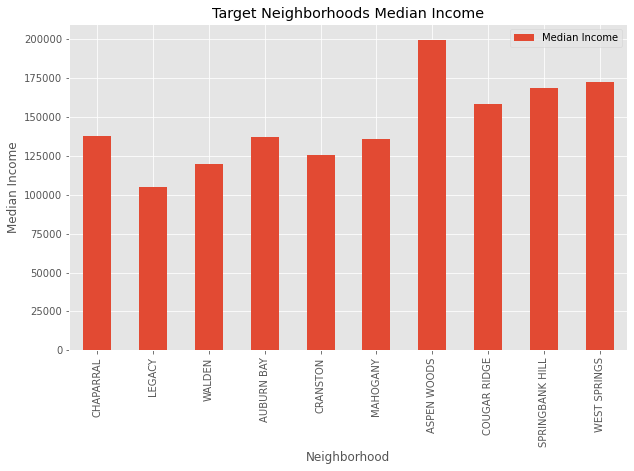

In [121]:
Median_income=xls_file.copy()
Median_income.drop(columns=['Population', '% spending 30% or more on shelter'], axis=1, inplace=True)

Median_income.plot(kind='bar', figsize=(10, 6))

plt.xlabel('Neighborhood') # add to x-label to the plot
plt.ylabel('Median Income') # add y-label to the plot
plt.title('Target Neighborhoods Median Income') # add title to the plot

plt.show()

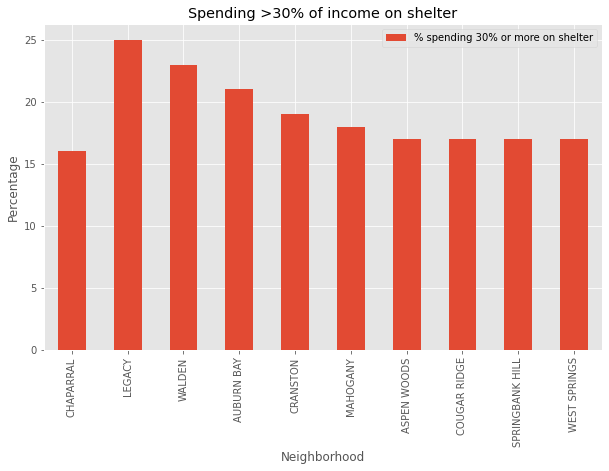

In [126]:
Disposable_income=xls_file.copy()
Disposable_income.drop(columns=['Population', 'Median Income'], axis=1, inplace=True)

Disposable_income.plot(kind='bar', figsize=(10, 6))

plt.xlabel('Neighborhood') # add to x-label to the plot
plt.ylabel('Percentage') # add y-label to the plot
plt.title('Spending >30% of income on shelter') # add title to the plot

plt.show()

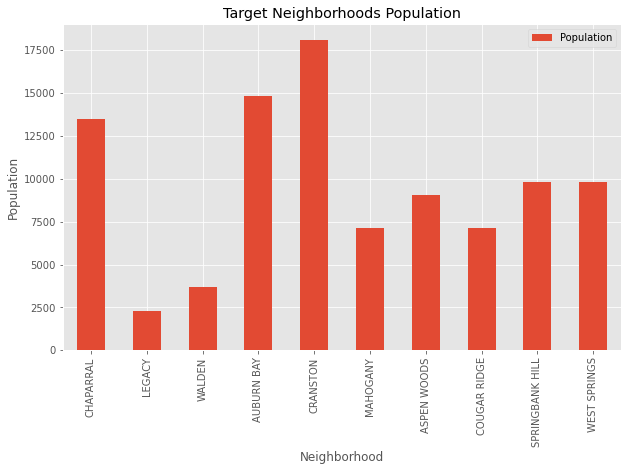

In [123]:
population=xls_file.copy()
population.drop(columns=['% spending 30% or more on shelter', 'Median Income'], axis=1, inplace=True)

population.plot(kind='bar', figsize=(10, 6))

plt.xlabel('Neighborhood') # add to x-label to the plot
plt.ylabel('Population') # add y-label to the plot
plt.title('Target Neighborhoods Population') # add title to the plot

plt.show()

# Results and Discussion

In Calgary, Italian Restaurant makeup just over 6% of the total number of restaurants in the city. The highest density of Italian restaurants is in the neighborhoods surrounding the downtown core. As you go farther into the bedroom communities the density drops significantly.

The candidate neighborhoods also have very low restaurants density in comparison to other the neighborhoods so competition would be low. The only candidate neighborhood that had an Italian restaurant was West Springs. 

However, finding an available location for the restaurant may be a more daunting task as very little land in the neighborhoods is zoned for commercial use.

## Conclusion <a name="conclusion"></a>

The purpose of this project was to identify potential neighborhoods in Calgary for a new Italian restaurant in order to assist our client in making a decision. Foursquare was the primary source for the restaurant data. Neighborhood demographics and geographical information was sourced from the City of Calgary.

The final decision on an optimal location for a new Italian restaurant will be made by the client based on a number of factors such as, future growth rates, availability of space, accessibility, parking, etc.